# Setup

**Libraries**

In [34]:
import os
import kagglehub
import matplotlib.pyplot as plt
from matplotlib.image import imread
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**Functions**

In [35]:
import random

def display_images_by_category(dataset_path, num_images=5):
    """
    Displays a few random images from each category in a directory structure.
    """
    try:
        categories = [d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))]
        if not categories:
            print("No categories found in the dataset path.")
            return

        for category in categories:
            category_path = os.path.join(dataset_path, category)
            image_files = [os.path.join(category_path, file) for file in os.listdir(category_path)
                           if file.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if not image_files:
                print(f"No images found in category: {category}")
                continue

            # Select random images for display
            selected_images = random.sample(image_files, min(num_images, len(image_files)))

            # Plot the images in a single row
            fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 5))
            fig.suptitle(f"Category: {category}", fontsize=16)

            for ax, img_path in zip(axes, selected_images):
                img = imread(img_path)
                ax.imshow(img)
                ax.set_title(os.path.basename(img_path), fontsize=10)
                ax.axis('off')

            plt.tight_layout()
            plt.show()

    except Exception as e:
        print(f"Error: {e}")


In [36]:
def display_images(dataset_path, num_images=9):
    """
    Display a grid of images with their labels from a given dataset.
    """
    # Take 1 batch of data from the dataset
    for images, labels in dataset_path.take(1):
        images = images.numpy()
        labels = labels.numpy()

        # Integers in the range [0, 255]
        images = images.clip(0, 255)
        images = images.astype("uint8")
        break

    # Plotting setup
    grid_size = int(num_samples**0.5)
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Plot the images with labels
    for i in range(min(num_samples, len(images))):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

## Import Data




In [37]:
dataset_path = kagglehub.dataset_download("ashishmotwani/tomato")
print("Path to dataset files:", dataset_path)

Path to dataset files: /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1


In [38]:
os.listdir(dataset_path + '/valid')

['Early_blight',
 'Septoria_leaf_spot',
 'powdery_mildew',
 'Tomato_Yellow_Leaf_Curl_Virus',
 'Target_Spot',
 'Leaf_Mold',
 'Bacterial_spot',
 'Spider_mites Two-spotted_spider_mite',
 'Late_blight',
 'Tomato_mosaic_virus',
 'healthy']

In [39]:
train_path = dataset_path + '/train'
valid_path = dataset_path + '/valid'

## View sample images

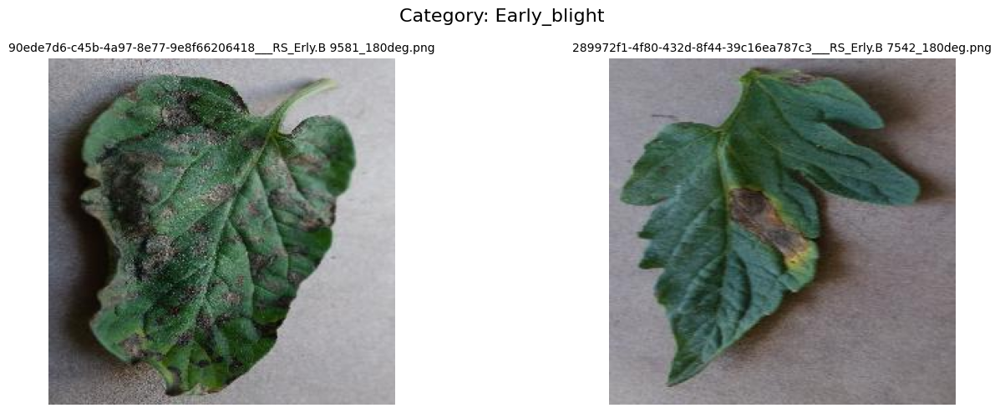

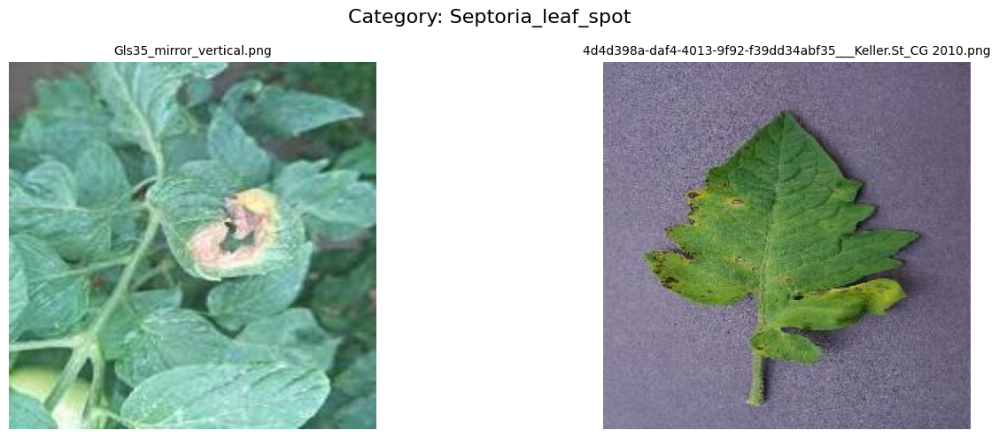

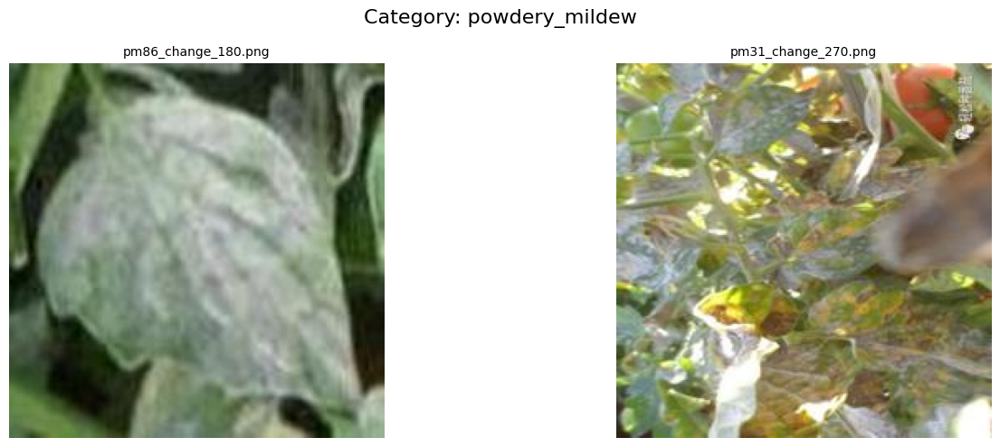

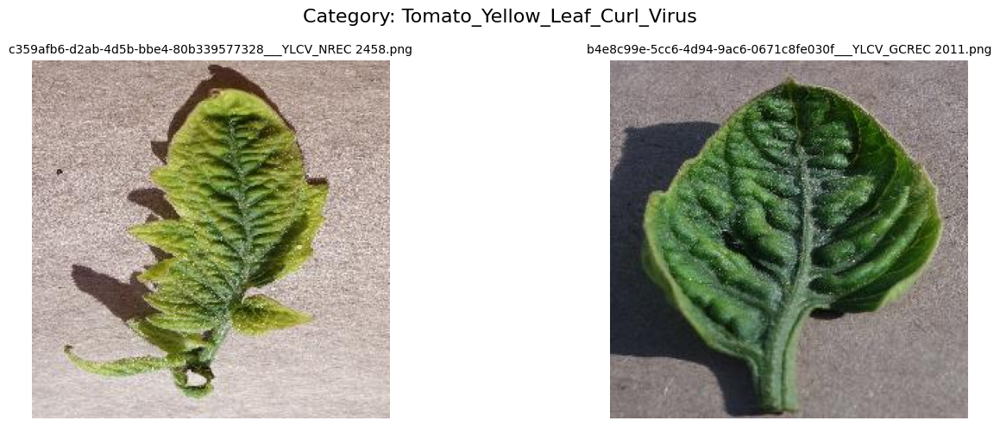

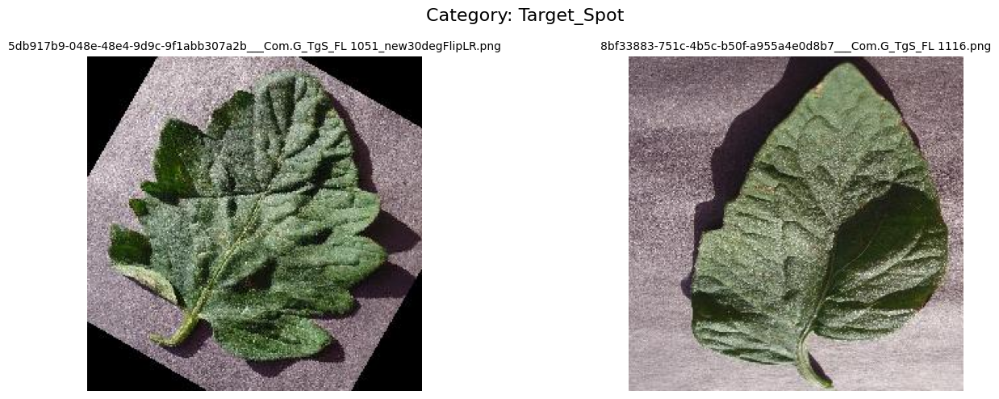

...

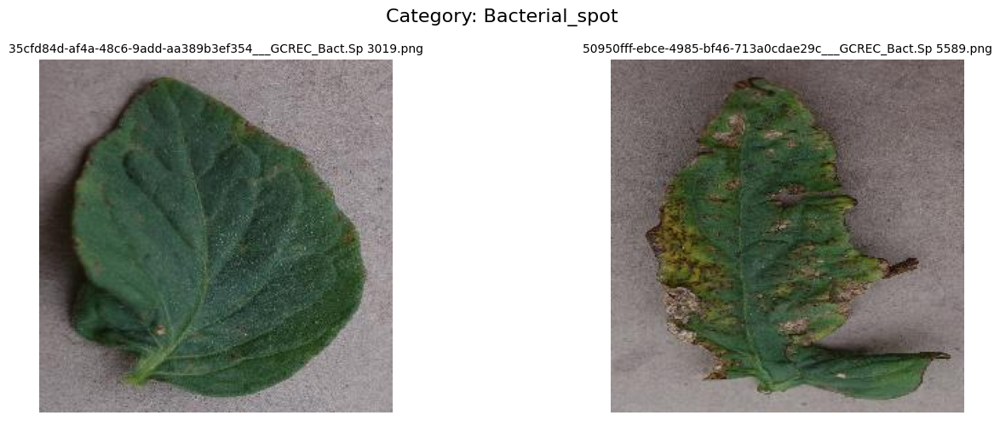

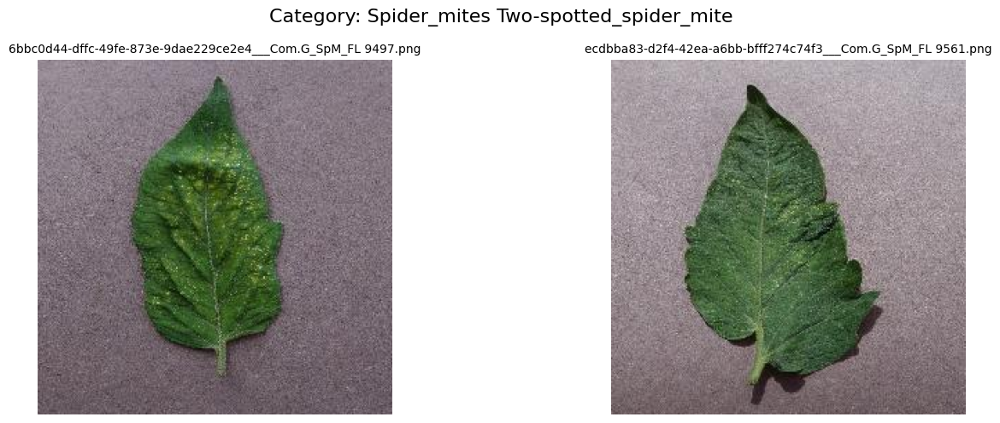

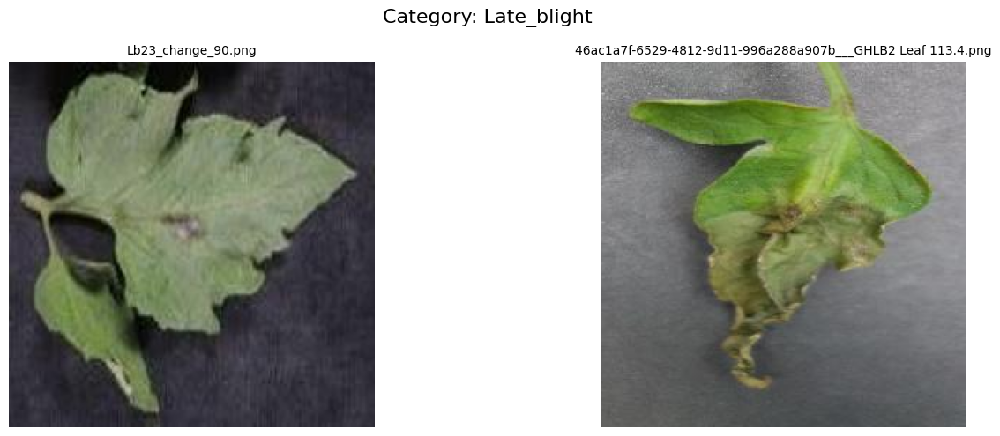

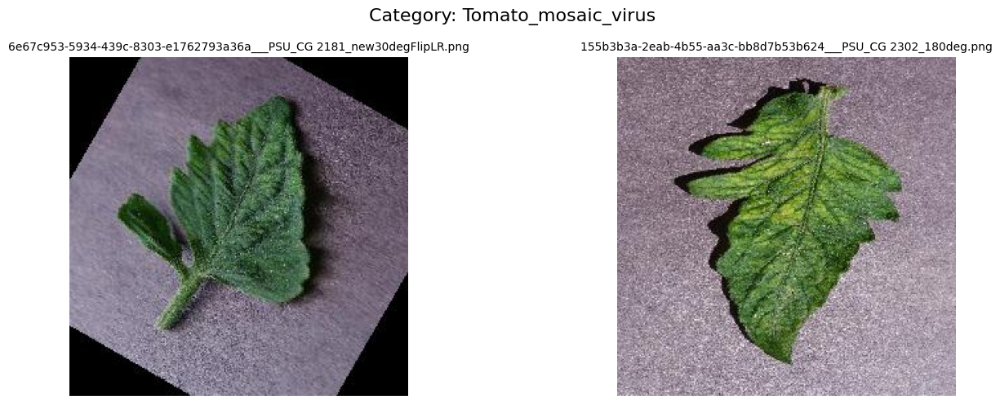

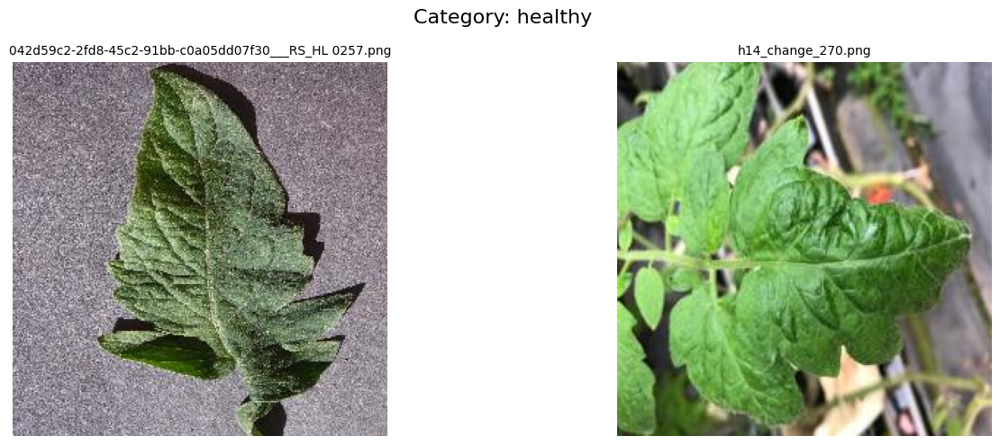

In [40]:
display_images_by_category(train_path, num_images=2)

In [41]:
# display_images_by_category(dataset_path, num_images=5)

In [42]:
# View all categories in train and validation data:
for path in [train_path, valid_path]:
    print("\n",path)
    for category in os.listdir(path):
        category_path = os.path.join(path, category)
        if os.path.isdir(category_path):
            print(f"Category: {category}")
            print("Number of samples:", len(os.listdir(category_path)))
            files = os.listdir(category_path)
            # print(f"Files: {files}")


 /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/train
Category: Early_blight
Number of samples: 2455
Category: Septoria_leaf_spot
Number of samples: 2882
Category: powdery_mildew
Number of samples: 1004
Category: Tomato_Yellow_Leaf_Curl_Virus
Number of samples: 2039
Category: Target_Spot
Number of samples: 1827
Category: Leaf_Mold
Number of samples: 2754
Category: Bacterial_spot
Number of samples: 2826
Category: Spider_mites Two-spotted_spider_mite
Number of samples: 1747
Category: Late_blight
Number of samples: 3037
Category: Tomato_mosaic_virus
Number of samples: 2153
Category: healthy
Number of samples: 2959

 /root/.cache/kagglehub/datasets/ashishmotwani/tomato/versions/1/valid
Category: Early_blight
Number of samples: 643
Category: Septoria_leaf_spot
Number of samples: 746
Category: powdery_mildew
Number of samples: 252
Category: Tomato_Yellow_Leaf_Curl_Virus
Number of samples: 498
Category: Target_Spot
Number of samples: 457
Category: Leaf_Mold
Number of samples

### Split training and validation data and resizing the data

In [43]:
# Load the entire dataset and reserve 20% for testing
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_path,
    image_size=(224, 224),
    batch_size=32
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    valid_path,
    image_size=(224, 224),
    batch_size=32
)

Found 25683 files belonging to 11 classes.
Found 6653 files belonging to 11 classes.


In [44]:
for x, y in train_dataset.take(1):
    # print("x:", x)
    print("y:", y)

y: tf.Tensor([9 8 4 3 8 1 5 0 8 1 9 9 3 7 9 8 3 3 0 8 8 9 2 3 4 9 8 5 0 0 7 3], shape=(32,), dtype=int32)


In [45]:
len(train_dataset), len(train_dataset)*32

(803, 25696)

In [46]:
len(validation_dataset), len(validation_dataset)*32

(208, 6656)

In [47]:
def display_samples(dataset, title, num_samples=9):
    """
    Display a grid of images with their labels from a given dataset.
    """
    # Take 1 batch of data from the dataset
    for images, labels in dataset.take(1):
        images = images.numpy()
        labels = labels.numpy()

        # Integers in the range [0, 255]
        images = images.clip(0, 255)
        images = images.astype("uint8")
        break

    # Plotting setup
    grid_size = int(num_samples**0.5)
    plt.figure(figsize=(10, 10))
    plt.suptitle(title, fontsize=16)

    # Plot the images with labels
    for i in range(min(num_samples, len(images))):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(images[i])
        plt.title(f"Label: {labels[i]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

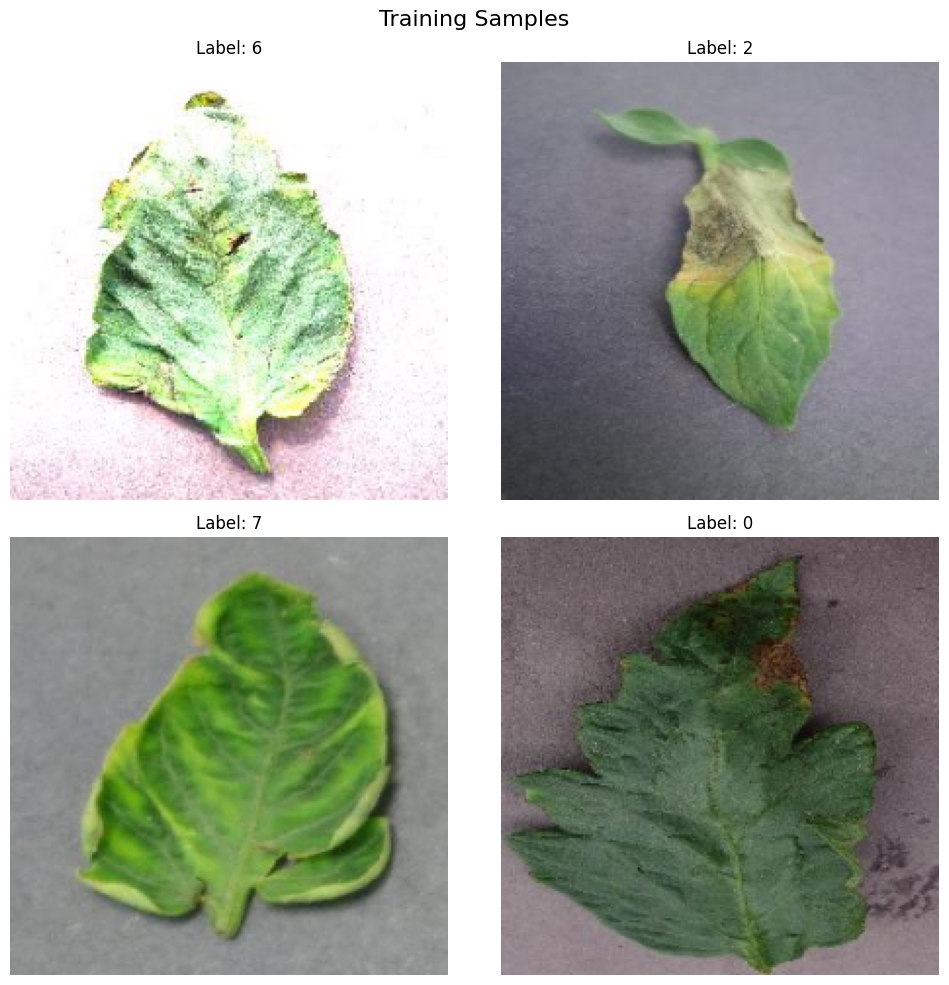

In [48]:
display_samples(train_dataset, "Training Samples", 4)

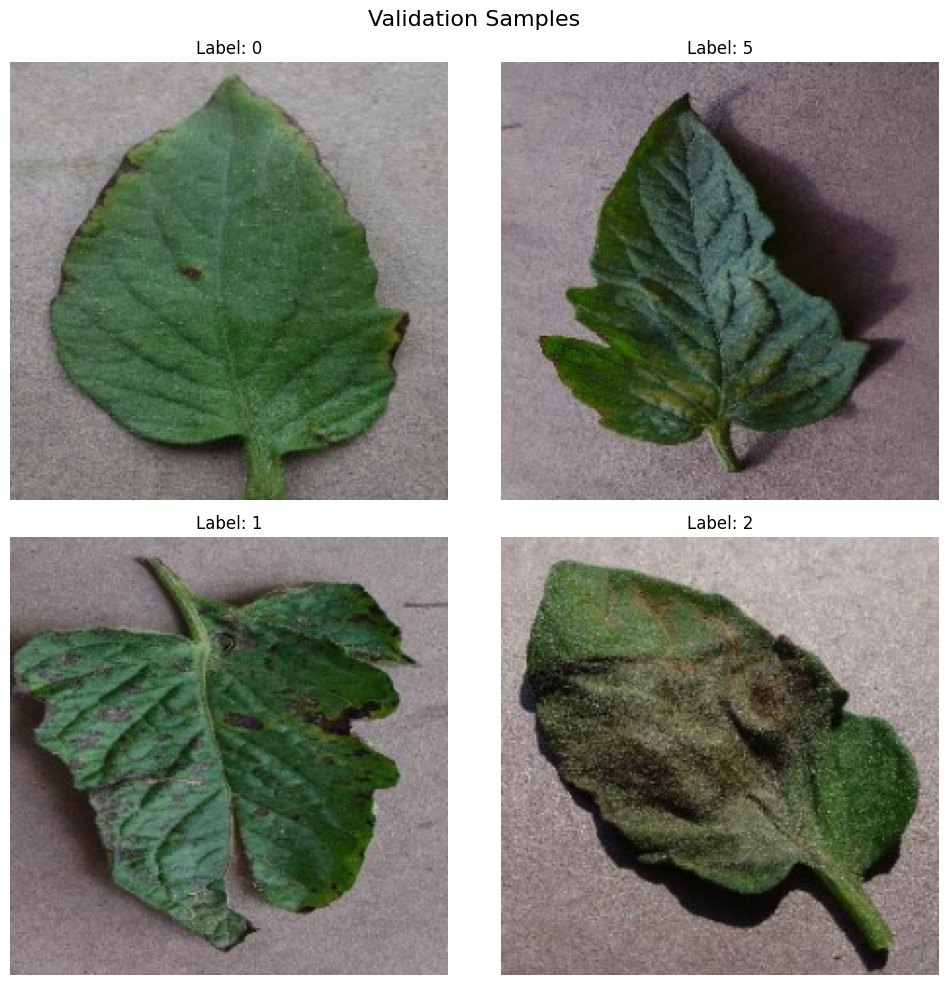

In [49]:
display_samples(validation_dataset, "Validation Samples", 4)

## Data Augmentation

Dat augmentation is used to prevent overffing by adding variability to the training data. This medthod improve generalization by helping the model learn features that are in various different orientations, scale and position. The following transformations are applied to enhance dataset diversity:

- Geometric Transformations: Flip, rotate, crop, or resize.

- Color Adjustments: Change brightness, contrast, saturation, or apply grayscale.

- Noise Injection: Add random noise for robustness.

- Distortions: Apply random zoom, shear, or perspective transformations.

In [50]:
import tensorflow as tf
from tensorflow.keras.layers import (
    RandomFlip, RandomRotation, RandomZoom, RandomCrop, RandomTranslation,
    Rescaling, RandomContrast, RandomBrightness
)

data_augmentation = tf.keras.Sequential([
    # Geometric Transformations
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomCrop(height=200, width=200),
    RandomTranslation(height_factor=0.1, width_factor=0.1),

    # Color Adjustments
    RandomBrightness(factor=0.2),
    RandomContrast(factor=0.2),

    # Normalization so that the pixel values in most images are represented as
    # integers between 0 and 255, and scaling them to [0, 1] helps a CNN model
    # train more effectively by standardizing the input range.
    Rescaling(1.0 / 255),

    # Distortions
    RandomZoom(height_factor=0.0, width_factor=(-0.3, 0.3))
])

In [51]:
# Apply data augmentation to the training dataset
train_dataset_augmented = train_dataset.map(lambda x, y: (data_augmentation(x, training=True), y))

shape (32, 200, 200, 3)


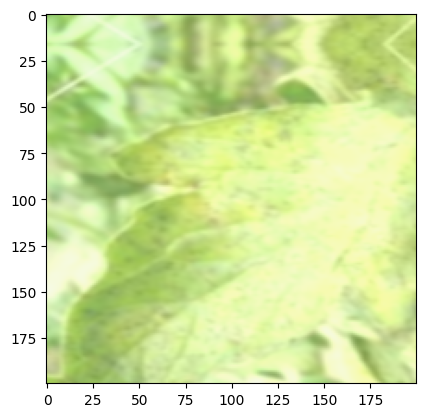

In [52]:
for batch in train_dataset_augmented.take(1):
    print("shape", batch[0].numpy().shape)
    plt.imshow(batch[0].numpy()[0])
    plt.show()


## Label Encoding

Categorical Labels: Convert class names into integers or one-hot encoding for classification tasks.

In [53]:
# List of categories
labels = [
    'powdery_mildew', 'Septoria_leaf_spot', 'Target_Spot', 'Leaf_Mold',
    'Tomato_mosaic_virus', 'Late_blight', 'Spider_mites Two-spotted_spider_mite',
    'Early_blight', 'Tomato_Yellow_Leaf_Curl_Virus', 'healthy', 'Bacterial_spot'
]

# Create a dictionary for label encoding
label_mapping = {name: idx for idx, name in enumerate(labels)}

print("Label Mapping:")
print(label_mapping)

Label Mapping:
{'powdery_mildew': 0, 'Septoria_leaf_spot': 1, 'Target_Spot': 2, 'Leaf_Mold': 3, 'Tomato_mosaic_virus': 4, 'Late_blight': 5, 'Spider_mites Two-spotted_spider_mite': 6, 'Early_blight': 7, 'Tomato_Yellow_Leaf_Curl_Virus': 8, 'healthy': 9, 'Bacterial_spot': 10}


In [54]:
# Encode labels
encoded_labels = [label_mapping[label] for label in labels]

print("Encoded Labels:")
print(encoded_labels)

Encoded Labels:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [55]:
# Map encoded labels to TensorFlow dataset
train_dataset_with_labels = train_dataset_augmented.map(lambda x, y: (x, tf.one_hot(y, depth=len(labels))))
validation_dataset_with_labels = validation_dataset.map(lambda x, y: (x, tf.one_hot(y, depth=len(labels))))
# Verify the labels
for images, labels in train_dataset_with_labels.take(1):
    print("One-hot Encoded Labels:")
    print(labels.numpy())

One-hot Encoded Labels:
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0.

# MobileNetV2 Model

The code to set up the transfer learning base was found on:

https://kshitijkutumbe.medium.com/building-an-image-classification-model-with-transfer-learning-in-tensorflow-4ab203783ec9


In [56]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.applications import MobileNetV2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

Some of the code from model layer construction was found at:

https://clemsonciti.github.io/rcde_workshops/python_deep_learning/07-Convolution-Neural-Network.html

In [68]:
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Freeze the base model

# Add our own classifier on top
model = models.Sequential([
    base_model,
    layers.Conv2D(8, (3, 3),strides=(1, 1), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(32, (3,3), activation='relu', padding='same'),
    layers.Dropout(0.20),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.Dropout(0.35),
    layers.Flatten(),
    layers.Dense(11, activation='softmax')
])

In [58]:
# convert all of the images to PNG

from PIL import Image

def convert_images_to_png(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.bmp', '.gif')):  # Add other formats if needed
                filepath = os.path.join(root, file)
                try:
                    img = Image.open(filepath)
                    png_filepath = os.path.splitext(filepath)[0] + ".png"
                    img.save(png_filepath, "PNG")
                    print(f"Converted {filepath} to {png_filepath}")
                    os.remove(filepath) #remove the original file
                    print(f"Removed original file {filepath}")
                except IOError as e:
                    print(f"Error converting {filepath}: {e}")

# Example usage (replace with your dataset paths):
convert_images_to_png(train_path)
convert_images_to_png(valid_path)

In [59]:
# Update train_dataset_with_labels to use the PNG filepaths
train_dataset_with_labels = tf.keras.utils.image_dataset_from_directory(
    train_path, # Update train_path to point to the directory containing PNG images
    labels='inferred',
    label_mode='int',
    image_size=(224, 224),
    interpolation='nearest',
    batch_size=32,
    shuffle=True
)

Found 25683 files belonging to 11 classes.


In [60]:
train_images = []
train_labels = []

for images, labels in train_dataset_with_labels:
    for i in range(images.shape[0]):
        train_images.append(images[i].numpy())
        train_labels.append(labels[i].numpy())

train_images_df = pd.DataFrame({'image': train_images})
train_labels_df = pd.DataFrame({'label': train_labels})


In [61]:
validation_dataset_with_labels = tf.keras.utils.image_dataset_from_directory(
    valid_path, # Update train_path to point to the directory containing PNG images
    labels='inferred',
    label_mode='int',
    image_size=(224, 224),
    interpolation='nearest',
    batch_size=32
)

Found 6653 files belonging to 11 classes.


In [62]:
val_images = []
val_labels = []

for images, labels in validation_dataset_with_labels:
    for i in range(images.shape[0]):
        val_images.append(images[i].numpy())
        val_labels.append(labels[i].numpy())

val_images_df = pd.DataFrame({'image': val_images})
val_labels_df = pd.DataFrame({'label': val_labels})

In [63]:
import numpy as np # Import numpy

# Convert the 'image' column to a NumPy array of images before fitting
train_images = np.array(train_images_df['image'].tolist()) # Convert to numpy array
val_images = np.array(val_images_df['image'].tolist()) # Convert to numpy array

# Convert the labels to NumPy arrays as well
train_labels = train_labels_df['label'].to_numpy() # Convert to numpy array
val_labels = val_labels_df['label'].to_numpy() # Convert to numpy array

In [69]:
model.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(train_images, train_labels, epochs=20, validation_data=(val_images, val_labels))

Epoch 1/20
803/803 [==============================] - 229s 281ms/step - loss: 2.0545 - accuracy: 0.2454 - val_loss: 1.8759 - val_accuracy: 0.3263
Epoch 2/20
803/803 [==============================] - 220s 274ms/step - loss: 1.5495 - accuracy: 0.4516 - val_loss: 1.3783 - val_accuracy: 0.5297
Epoch 3/20
803/803 [==============================] - 224s 278ms/step - loss: 1.3562 - accuracy: 0.5321 - val_loss: 1.1799 - val_accuracy: 0.5978
Epoch 4/20
803/803 [==============================] - 224s 279ms/step - loss: 1.2410 - accuracy: 0.5758 - val_loss: 1.1576 - val_accuracy: 0.6053
Epoch 5/20
803/803 [==============================] - 222s 277ms/step - loss: 1.1613 - accuracy: 0.6071 - val_loss: 1.0491 - val_accuracy: 0.6394
Epoch 6/20
803/803 [==============================] - 224s 279ms/step - loss: 1.0909 - accuracy: 0.6264 - val_loss: 1.0378 - val_accuracy: 0.6412
Epoch 7/20
803/803 [==============================] - 220s 275ms/step - loss: 1.0411 - accuracy: 0.6408 - val_loss: 0.9877 -

In [70]:
test_loss, test_acc = model.evaluate(val_images, val_labels, verbose=2)
print(f"Test accuracy: {test_acc}")

208/208 - 45s - loss: 0.8128 - accuracy: 0.7189 - 45s/epoch - 217ms/step
Test accuracy: 0.718923807144165


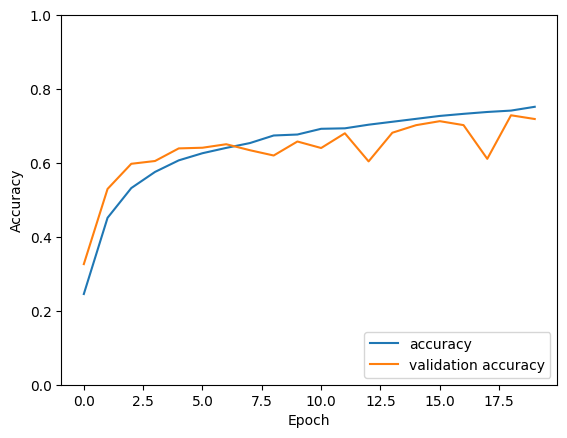

In [71]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()